<a href="https://colab.research.google.com/github/fellowship/platform-demos3/blob/master/InriaAerialImages/Inria_SlidingWindowPatches_250_resnet18.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Inria Aerial Satellite Image Labelling

The main aim of this challenge is to be able to classify pixels as 'building' or 'not building'. This is a clear case of semantic segmentation. We have180 aerial images from various cities with a resolution of 5000 X 5000, along with the segmented masks of 5000 X 5000. Our goal is to classify each of the pixels in the test image and generate a masks for the test images too.

**Project Notebook created by : Pallavi Allada, Jhansi Anumula, Zoheb Abai**

In [1]:
# Setting up fastai in colab
!curl -s https://course.fast.ai/setup/colab | bash

Updating fastai...
Done.


In [0]:
# Notebook magic commands
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


## Download Preprocessed data from drive to colab

For code of preprocessing the data of creating sliding window patches check this [notebook](https://github.com/fellowship/platform-demos3/blob/master/InriaAerialImages/Inria_Preprocessing_SlidingWindowPatches_250.ipynb) 

In [0]:
# Copying the tar file to colab memory
!mkdir 'InriaPatches'
!cp 'drive/My Drive/fellowship/InriaDataset/train.tar' 'InriaPatches/'
!cp 'drive/My Drive/fellowship/InriaDataset/valid.tar' 'InriaPatches/'
!cp 'drive/My Drive/fellowship/InriaDataset/masks.tar' 'InriaPatches/'
!cp 'drive/My Drive/fellowship/InriaDataset/test.tar' 'InriaPatches/'

In [0]:
# Untar the tar files
!tar -zxf InriaPatches/train.tar -C InriaPatches/
!tar -zxf InriaPatches/valid.tar -C InriaPatches/
!tar -zxf InriaPatches/masks.tar -C InriaPatches/
!tar -zxf InriaPatches/test.tar -C InriaPatches/

In [0]:
# Remove all the tar files
!rm -rf InriaPatches/*.tar

## EDA

Import required fastai libraries

In [7]:
import fastai
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
print(fastai.__version__)

1.0.52


Check the sample images and their dimensions in train and test folders

In [0]:
root_dir = Path('InriaPatches')
train_path = root_dir/'train'
valid_path = root_dir/'valid'
mask_path = root_dir/'masks'
test_path = root_dir/'test'

In [9]:
train = get_image_files(train_path)
valid = get_image_files(valid_path)
masks = get_image_files(mask_path)
test = get_image_files(test_path)
len(train),len(valid), len(masks), len(test)

(60450, 9750, 70200, 70200)

In [11]:
# Size of each image and its mask
image = open_image(train[0])
img_size = np.array(image.shape[1:])
print(image.shape)

mask = open_mask(masks[0], div=True)
print(mask.shape)
mask_size = np.array(mask.shape[1:])

np.unique(np.array(mask.data))

torch.Size([3, 250, 250])
torch.Size([1, 250, 250])


array([0, 1])

Function to get the corresponding mask file (labels) of an image file (inputs)

In [12]:
get_mask_file = lambda x: mask_path/f'{x.stem.split("/")[-1]}.tif'
img = train[0]
img, get_mask_file(img)

(PosixPath('InriaPatches/train/vienna19_0146.tif'),
 PosixPath('InriaPatches/masks/vienna19_0146.tif'))

## Data Viz.

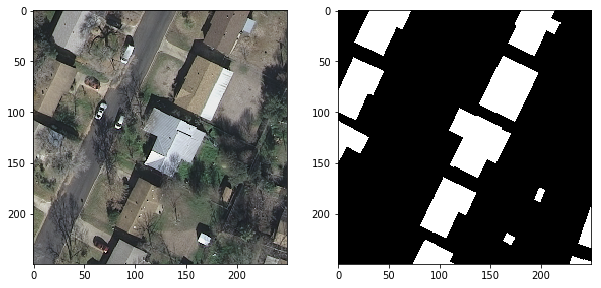

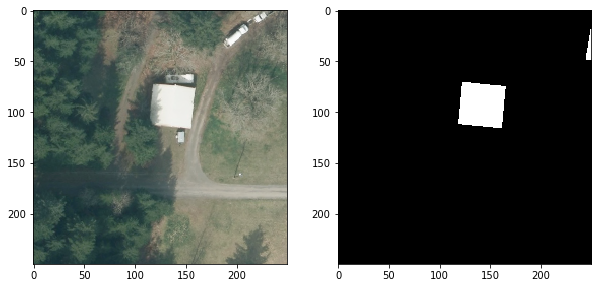

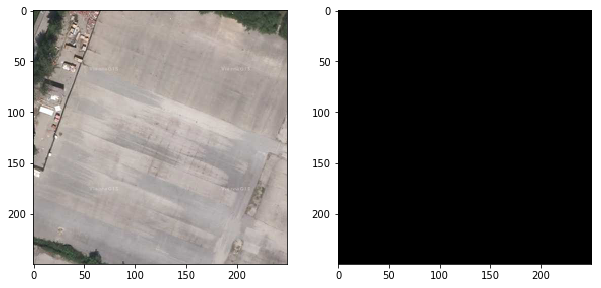

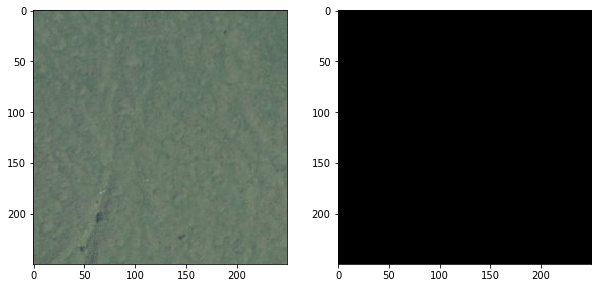

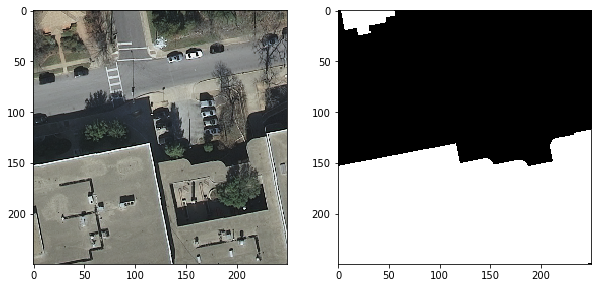

In [13]:
import matplotlib.pyplot as plt

'''Display a sample of random images as their corresponding masks'''
def display_image_mask_grid(n):
  images_list = []
  for i in range(n):
    images_list.append(random.choice(os.listdir(train_path)))
  for idx, image in enumerate(images_list):  
    fig, axs = plt.subplots(1, 2, figsize=(10, 10))
    img = plt.imread(str(train_path/image))
    axs[0].imshow(img)
    msk = plt.imread(str(mask_path/image))
    axs[1].imshow(msk, cmap='gray')    
    plt.grid(False)
    plt.show()  
    

display_image_mask_grid(5)

## U-Net Model

In [14]:
# Parameters
codes = np.array(['NotBuilding','Building'])
src_size = np.array(mask.shape[1:])
size = src_size
bs = 16
size, bs

(array([250, 250]), 16)

In [0]:
# Subclass the segmentation label list to get masked values within 0 and 1
class MaskSegmentationLabelList(SegmentationLabelList):
    def open(self, fn): 
      return open_mask(fn, div=True)

class MaskSegmentationItemList(ImageList):
    _label_cls,_square_show_res = MaskSegmentationLabelList, False

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes)
tfms = get_transforms(flip_vert=True, max_lighting=0.3, max_zoom=1.2, max_warp=0.) 
data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats)
)

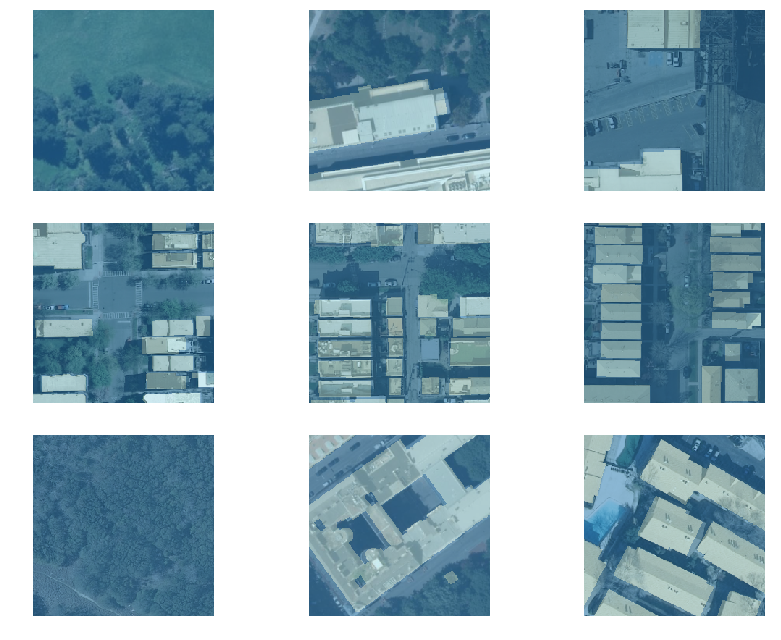

In [24]:
# Visualizing a batch from databunch
data.show_batch(rows=3, figsize=(12,9))

In [20]:
# Display data(x,y) in train and validation sets
len(data.train_ds.x.items), len(data.train_ds.y.items),len(data.valid_ds.x.items), len(data.valid_ds.y.items)

(60450, 60450, 9750, 9750)

In [21]:
# Labels
data.classes

array(['NotBuilding', 'Building'], dtype='<U11')

### Custom Loss

In [0]:
def dice_loss(input, target):
    smooth = 1.
    input = input[:,1,None].sigmoid()
    iflat = input.contiguous().view(-1).float()
    tflat = target.view(-1).float()
    intersection = (iflat * tflat).sum()
    return (1 - ((2. * intersection + smooth) / ((iflat + tflat).sum() +smooth)))

def combo_loss(pred, targ):
    bce_loss = CrossEntropyFlat(axis=1)
    return bce_loss(pred,targ) + dice_loss(pred,targ)

In [0]:
# Defining Metrics
#iou = partial(dice, iou=True)
metrics = [dice_loss, accuracy_thresh, dice]

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/checkpoints/resnet18-5c106cde.pth
100%|██████████| 46827520/46827520 [00:02<00:00, 19013729.00it/s]


In [0]:
#Defining the metrics and loss function
learn.metrics = metrics
learn.loss_func = combo_loss

## First Stage of Training the model

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


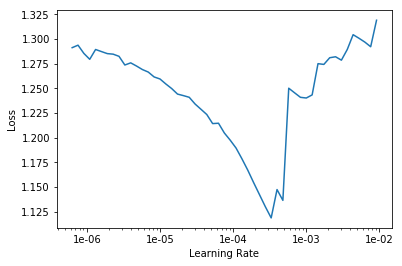

In [0]:
# Freeze the model and plot the Loss- Lr curve
learn.freeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.427136,0.372562,0.220152,0.935358,0.785337,1:46:17
1,0.329237,0.318181,0.185460,0.950413,0.806176,1:45:22
2,0.304618,0.295270,0.171637,0.951803,0.828981,1:45:05
3,0.296830,0.276364,0.161693,0.955532,0.834014,1:44:47
4,0.277173,0.272736,0.159483,0.956649,0.837017,1:44:55


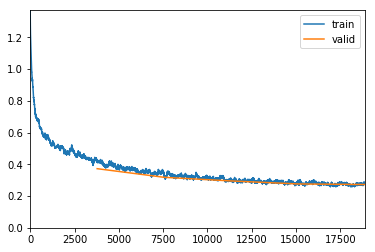

Better model found at epoch 0 with dice value: 0.7853372097015381.
Better model found at epoch 1 with dice value: 0.806175708770752.
Better model found at epoch 2 with dice value: 0.8289813995361328.
Better model found at epoch 3 with dice value: 0.8340136408805847.
Better model found at epoch 4 with dice value: 0.8370166420936584.


In [0]:
# Training the model for 5 epochs
learn.fit_one_cycle(5, max_lr=1e-04, callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_1.pth'

### Fine-tuning the Model

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes)
tfms = get_transforms(flip_vert=True, max_lighting=0.3, max_zoom=1.2, max_warp=0.) 
data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats)
)

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)
learn.metrics = metrics
learn.loss_func = combo_loss

In [0]:
# Copy the model from gdrive
!cp 'drive/My Drive/fellowship/InriaDataset/bestIOU_1.pth' 'InriaPatches/models/'

In [0]:
# Load the trained model
learn = learn.load("bestIOU_1")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


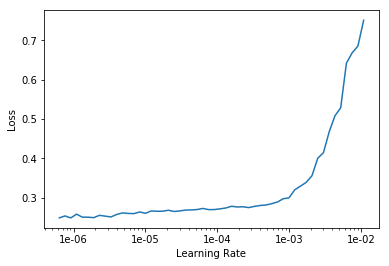

In [0]:
# Un-Freeze the model and plot the Loss- Lr curve
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.288388,0.290576,0.170526,0.953440,0.826081,46:15
1,0.294127,0.283956,0.164995,0.954656,0.833040,46:09
2,0.264208,0.269765,0.158027,0.957446,0.839363,46:07
3,0.258708,0.259021,0.151147,0.958543,0.847500,46:09
4,0.246633,0.259404,0.151624,0.958732,0.846178,46:12


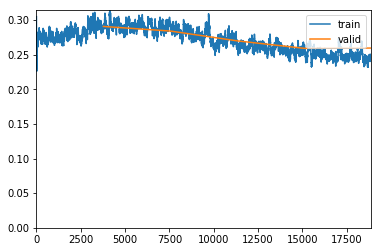

Better model found at epoch 0 with dice value: 0.8260810375213623.
Better model found at epoch 1 with dice value: 0.8330402374267578.
Better model found at epoch 2 with dice value: 0.8393634557723999.
Better model found at epoch 3 with dice value: 0.8474997282028198.


In [0]:
# Training the model for 5 epochs
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-04), callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_2.pth'

### Tuning Again

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.256109,0.266249,0.154851,0.958306,0.840466,46:12
1,0.247756,0.272790,0.158289,0.957704,0.837080,45:57
2,0.247163,0.259658,0.150764,0.959109,0.846848,45:56
3,0.243964,0.258144,0.150331,0.959665,0.846269,46:02
4,0.237515,0.251169,0.146260,0.960219,0.851562,46:03


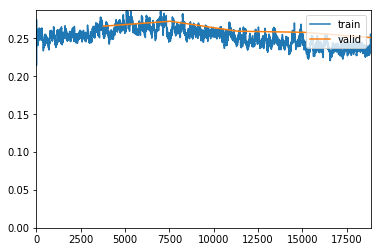

Better model found at epoch 0 with dice value: 0.840466320514679.
Better model found at epoch 2 with dice value: 0.8468479514122009.
Better model found at epoch 4 with dice value: 0.8515623211860657.


In [0]:
# Training the model for 5 epochs
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-04), callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_3.pth'

## Second Stage of Training the Model

Since this training we want our model to not implement rotation as Image Augmentation. Add max_rotate=0 in get_transforms during 2nd and final stage of training

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes)
tfms = get_transforms(flip_vert=True, max_lighting=0.3, max_zoom=1.2, max_warp=0., max_rotate=0.)
data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats)
)

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)
learn.metrics = metrics
learn.loss_func = combo_loss

In [0]:
# Copy the model from gdrive
!cp 'drive/My Drive/fellowship/InriaDataset/bestIOU_3.pth' 'InriaPatches/models/'

In [0]:
# Load the trained model
learn = learn.load("bestIOU_3")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


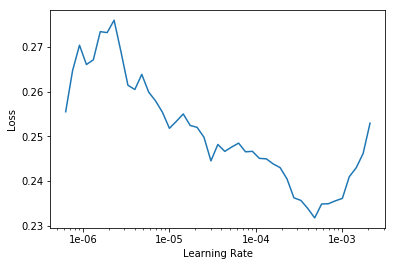

In [0]:
# Freeze the model and plot the Loss- Lr curve
learn.freeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.241786,0.259769,0.150889,0.958264,0.847836,46:17
1,0.252735,0.259086,0.151157,0.959331,0.847051,46:16
2,0.244070,0.252083,0.145732,0.960252,0.852467,46:15
3,0.243926,0.248472,0.144552,0.960650,0.853571,46:17
4,0.229449,0.244671,0.142603,0.961299,0.855208,46:18


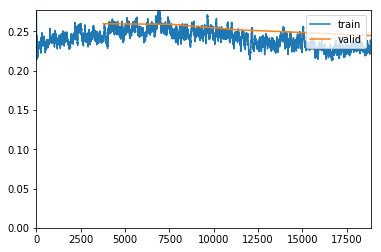

Better model found at epoch 0 with dice value: 0.8478361368179321.
Better model found at epoch 2 with dice value: 0.8524667620658875.
Better model found at epoch 3 with dice value: 0.8535712957382202.
Better model found at epoch 4 with dice value: 0.8552079200744629.


In [0]:
# Training the model for 5 epochs
lr = 1e-04
learn.fit_one_cycle(5, max_lr=lr, callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_4.pth'

### Fine-tuning

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes)
tfms = get_transforms(flip_vert=True, max_lighting=0.3, max_zoom=1.2, max_warp=0., max_rotate=0.)
data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats)
)

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)
learn.metrics = metrics
learn.loss_func = combo_loss

In [0]:
# Copy the model from gdrive
!cp 'drive/My Drive/fellowship/InriaDataset/bestIOU_4.pth' 'InriaPatches/models/'

In [0]:
# Load the trained model
learn = learn.load("bestIOU_4")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.10E-06


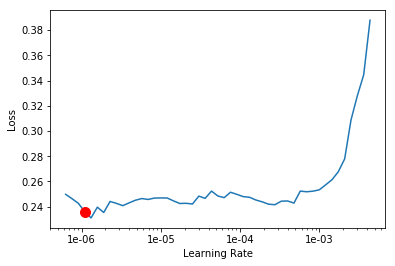

In [0]:
# Un-Freeze the model and plot the Loss- Lr curve
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.231037,0.244783,0.142584,0.961200,0.855105,47:13
1,0.231332,0.244157,0.142360,0.961303,0.855237,47:16
2,0.229685,0.242246,0.141360,0.961551,0.856662,47:15
3,0.225548,0.242071,0.141034,0.961564,0.857443,47:15
4,0.221198,0.243151,0.141741,0.961547,0.856144,47:13


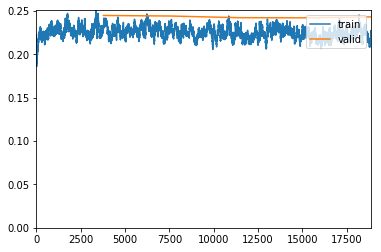

Better model found at epoch 0 with dice value: 0.8551049828529358.
Better model found at epoch 1 with dice value: 0.8552367687225342.
Better model found at epoch 2 with dice value: 0.8566616773605347.
Better model found at epoch 3 with dice value: 0.8574432134628296.


In [0]:
# Training the model for 5 epochs
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-05), callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_5.pth'

### Tuning Again

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.214399,0.244156,0.142284,0.961512,0.855282,47:10
1,0.225250,0.244643,0.142427,0.961253,0.855358,47:14
2,0.223254,0.242617,0.140788,0.961671,0.857748,47:12
3,0.226981,0.241658,0.140420,0.961742,0.857828,47:11
4,0.213178,0.241575,0.140424,0.961734,0.857903,47:12


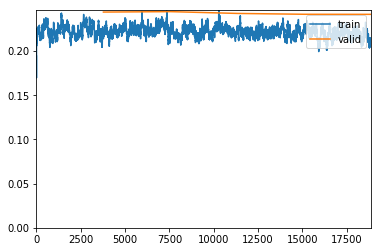

Better model found at epoch 0 with dice value: 0.8552824258804321.
Better model found at epoch 1 with dice value: 0.855358362197876.
Better model found at epoch 2 with dice value: 0.8577483892440796.
Better model found at epoch 3 with dice value: 0.8578275442123413.
Better model found at epoch 4 with dice value: 0.857903242111206.


In [0]:
# Training the model for 5 epochs
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-05), callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_6.pth'

## Final Stage of Training the Model

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes)
tfms = get_transforms(flip_vert=True, max_lighting=0.3, max_zoom=1.2, max_warp=0., max_rotate=0.)
data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats)
)

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)
learn.metrics = metrics
learn.loss_func = combo_loss

In [0]:
# Copy the model from gdrive
!cp 'drive/My Drive/fellowship/InriaDataset/bestIOU_6.pth' 'InriaPatches/models/'

In [0]:
# Load the trained model
learn = learn.load("bestIOU_6")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 4.79E-06


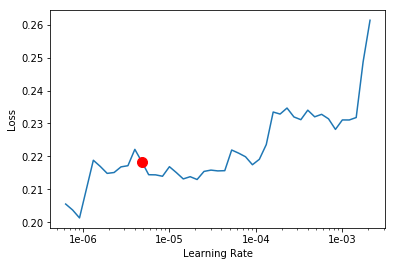

In [0]:
# Freeze the model and plot the Loss- Lr curve
learn.freeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.215534,0.241882,0.140665,0.961690,0.857729,47:41
1,0.225148,0.242441,0.140658,0.961560,0.858068,47:40
2,0.219528,0.242081,0.140744,0.961707,0.857650,47:40
3,0.224880,0.241038,0.140164,0.961796,0.858212,47:38


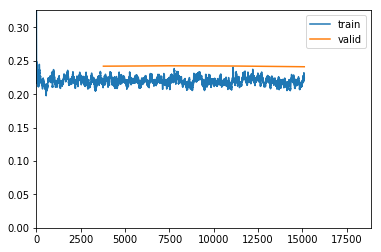

Better model found at epoch 0 with dice value: 0.8577293753623962.
Better model found at epoch 1 with dice value: 0.8580682277679443.
Better model found at epoch 3 with dice value: 0.8582118153572083.
Buffered data was truncated after reaching the output size limit.

In [0]:
#Training the model for 5 epochs
learn.fit_one_cycle(5, max_lr=4.79e-06, callbacks=[ShowGraph(learn), SaveModelCallback(learn, mode='max', every='improvement', monitor='dice', name='bestIOU')])

In [0]:
# Copy the best model to gdrive for later use
!cp 'InriaPatches/models/bestIOU.pth' 'drive/My Drive/fellowship/InriaDataset/bestIOU_7.pth'

**There is an extreme saturation of Accuracy and IOU value. So we stop our training here.**

## Prediction and Visualization on Validation Dataset

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes)
tfms = get_transforms(flip_vert=True, max_lighting=0.3, max_zoom=1.2, max_warp=0., max_rotate=0.)
data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats)
)

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)
learn.metrics = metrics
learn.loss_func = combo_loss

In [0]:
# Copy the model from gdrive
!cp 'drive/My Drive/fellowship/InriaDataset/bestIOU_7.pth' 'InriaPatches/models/'

In [0]:
# Load the trained model
learn = learn.load("bestIOU_7")

In [0]:
# Validate on validation dataset
learn.validate()

[0.24103826, tensor(0.1402), tensor(0.9618), tensor(0.8582)]

**Final IOU : 85.82%**

**Final Accuracy : 96.18%**

In [0]:
# Predicting on batch of validation dataset
outputs = learn.pred_batch(ds_type=DatasetType.Valid)
outputs.shape

torch.Size([16, 2, 250, 250])

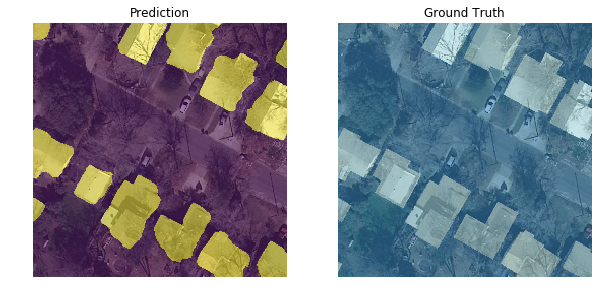

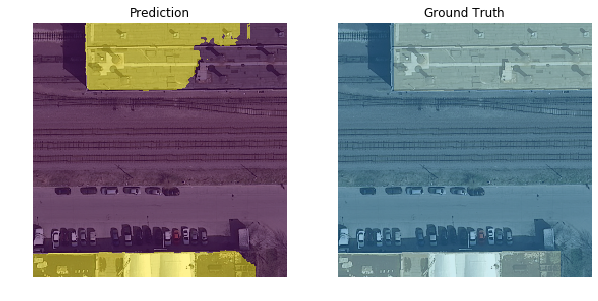

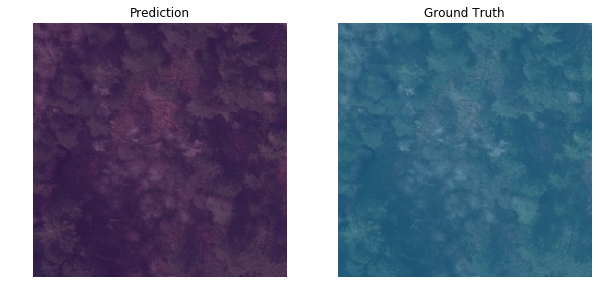

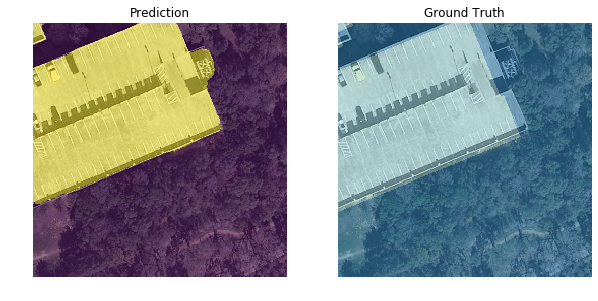

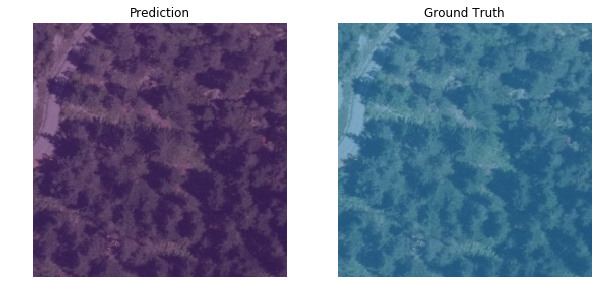

...

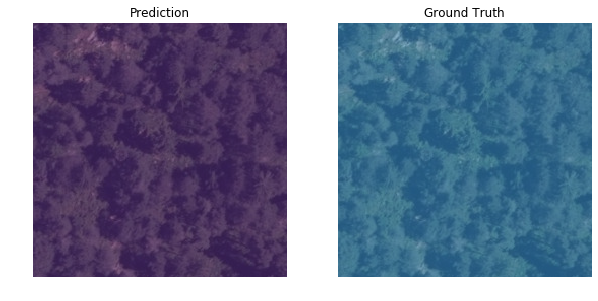

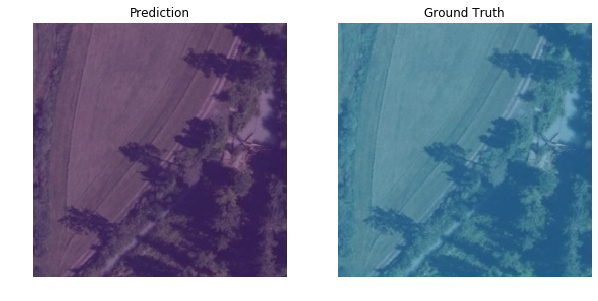

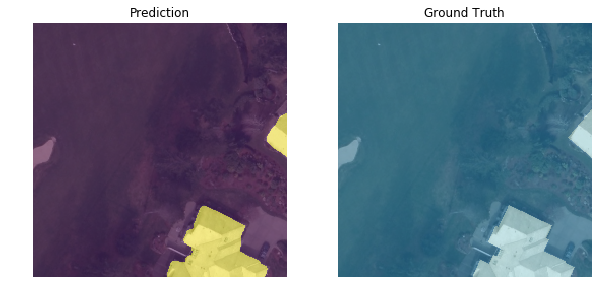

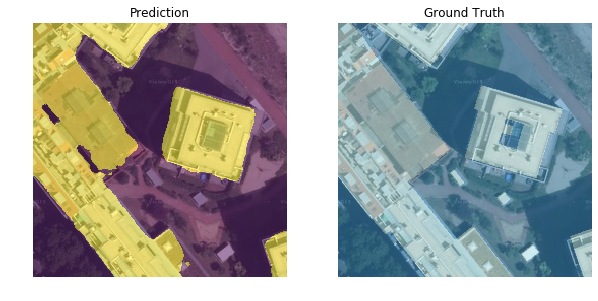

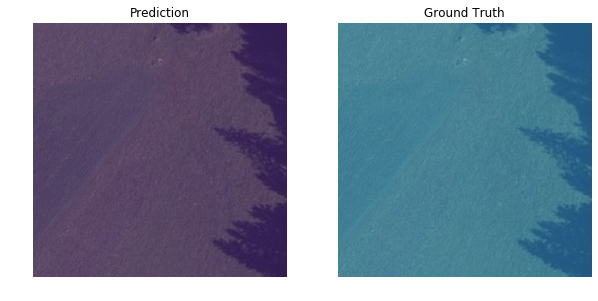

In [0]:
# Comparing Model's prediction and ground truth values
for i in range(bs):

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))

    data.valid_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow((to_np(outputs[i][1].sigmoid()>0.50)), alpha=0.5)
    
    ax2.set_title('Ground Truth')
    data.valid_ds.x[i].show(ax=ax2)
    data.valid_ds.y[i].show(ax=ax2, alpha=0.5)
    plt.show()

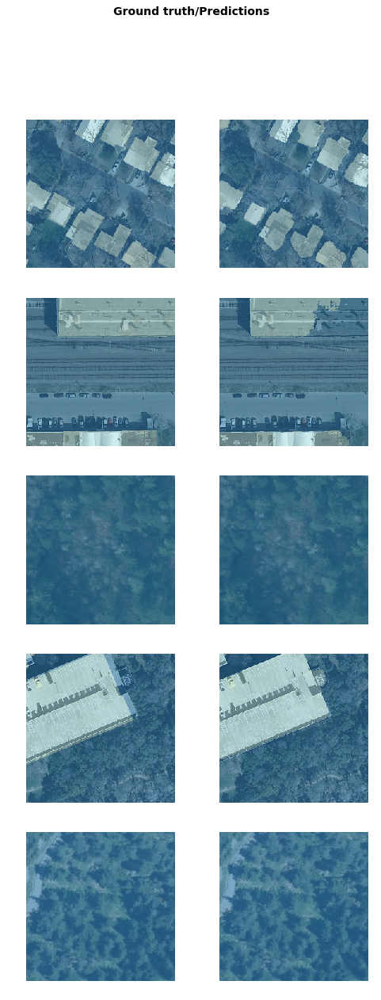

In [0]:
# Another predefined approach
learn.show_results()

## Visualizing Prediction on Test Images

In [0]:
# Using datablock api generate the databunch for training and validation set
src = MaskSegmentationItemList.from_folder(root_dir).split_by_folder('train','valid').label_from_func(get_mask_file, classes=codes).add_test_folder('test')
data = (src.databunch(bs=bs)
        .normalize(imagenet_stats))

In [0]:
# Defining the Model. Using pretrained resnet 18 model as encoder.
learn = unet_learner(data, models.resnet18, loss_func = combo_loss, metrics=metrics)
learn.metrics = metrics
learn.loss_func = combo_loss

In [0]:
# Copy the model from gdrive
!cp 'drive/My Drive/fellowship/Inria_Saved_Models/bestIOU_7.pth' 'InriaPatches/models/'

In [0]:
# Load the trained model
learn = learn.load("bestIOU_7")

In [54]:
# Predicting on batch of test dataset
preds = learn.pred_batch(ds_type=DatasetType.Test)
preds.shape

torch.Size([16, 2, 250, 250])

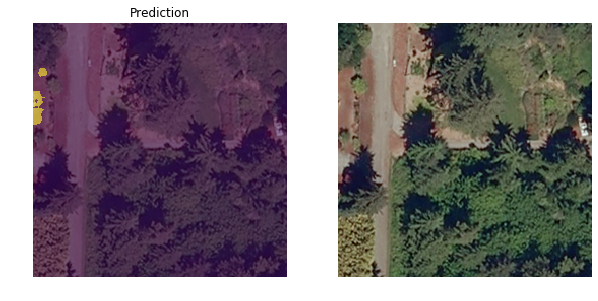

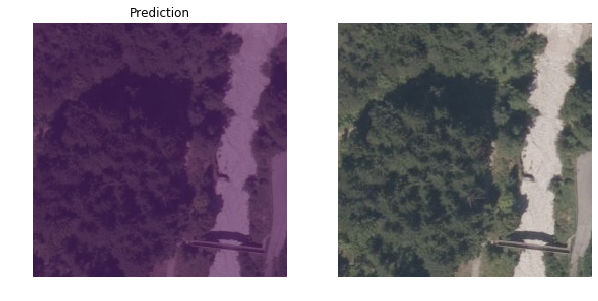

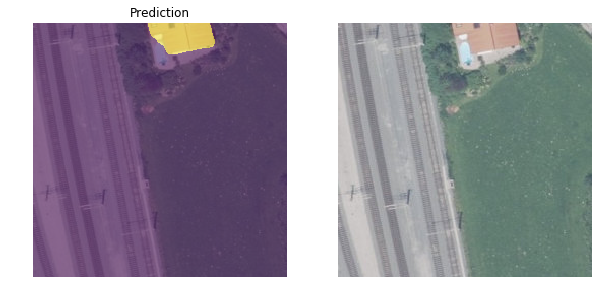

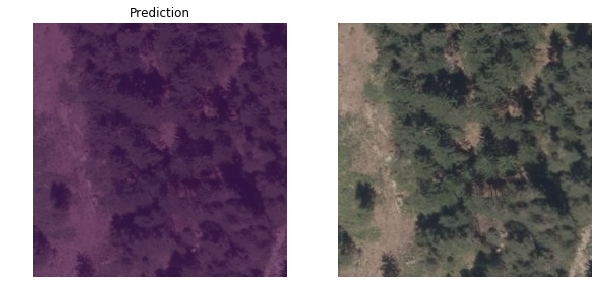

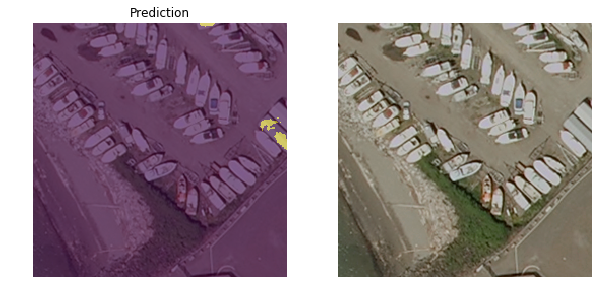

...

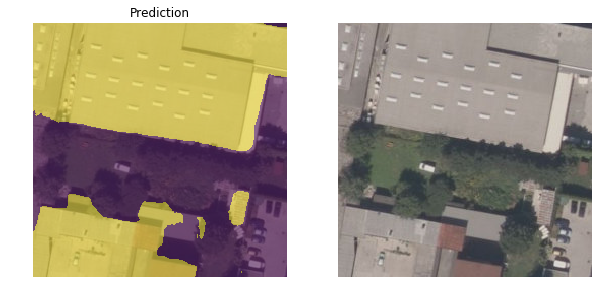

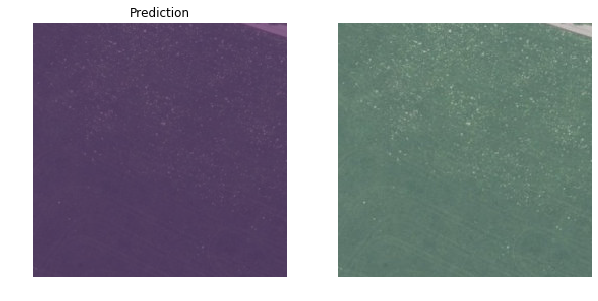

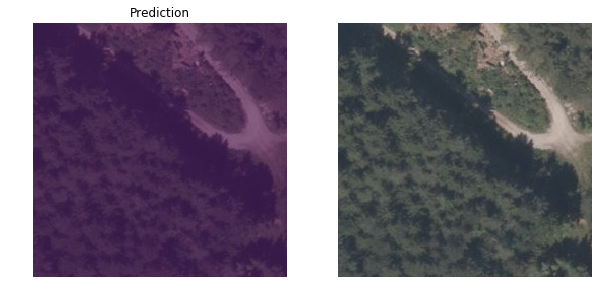

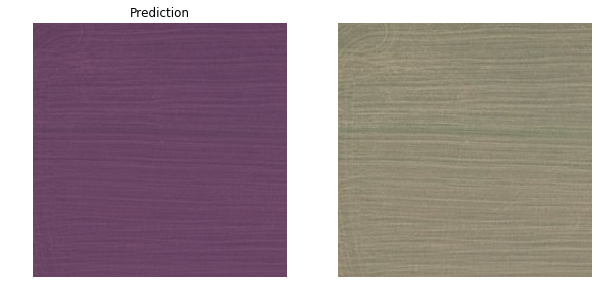

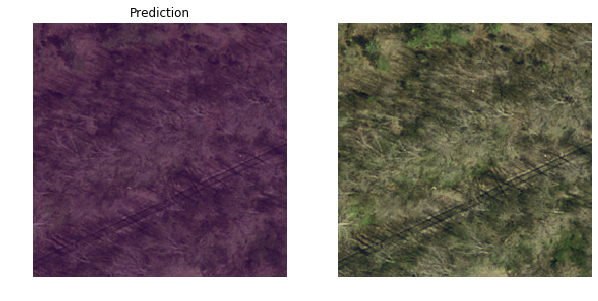

In [55]:
# Comparing Model's prediction on test images and Original test images
for i in range(bs):

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))

    data.test_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow((to_np(outputs[i][1].sigmoid()>0.50)), alpha=0.5)
    
    ax2.set_title('Original')
    data.test_ds.x[i].show(ax=ax2)
    data.test_ds.y[i].show(ax=ax2, alpha=0.5)
    plt.show()